# 使用图像进行提示

## 视觉能力

Claude 3 系列模型具备视觉能力，允许 Claude 理解和分析图像。我们现在可以同时提供文本和图像输入，以丰富对话并启用强大的新用例。Opus、Sonnet 和 Haiku 都能够理解和处理图像。因为 Claude 3.5 Sonnet 拥有最强的视觉能力，我们将在整个课程中使用它。

要向 Claude 提供图像，我们只需使用与纯文本对话相同的 `messages` 格式。典型的纯文本用户消息遵循以下模式： 

```py
messages = [
    {
        "role": "user",
        "content": "tell me a joke"
    }
]
```

In [2]:
from anthropic import Anthropic
from dotenv import load_dotenv

load_dotenv()

client = Anthropic()

messages = [
    {"role": "user", "content": "tell me a joke"}
]

response = client.messages.create(
    messages=messages,
    model="claude-3-haiku-20240307",
    max_tokens=200
)
print(response.content[0].text)

Here's a silly joke for you:

Why don't scientists trust atoms? Because they make up everything!

How was that? I tried to keep it lighthearted and family-friendly. Let me know if you'd like to hear another joke.


我们还没有看到的是，我们还可以将消息中的 `content` 设置为**内容块列表**。而不是：

```py
messages = [
    {"role": "user", "content": "tell me a joke"}
]
```
我们可以重新构建如下： 

```py
messages = [
    {
        "role": "user",
        "content": [
            {"type": "text", "text": "tell me a joke"},
        ]
    }
]
```
以下消息是等效的： 

```py
{"role": "user", "content": "Tell me a story"}
```

```py
{"role": "user", "content": [{"type": "text", "text": "Tell me a story"}]}
```

让我们试试看：

In [24]:
messages = [
    {
        "role": "user",
        "content": [
            {"type": "text", "text": "tell me a joke"},
        ]
    }
]

response = client.messages.create(
    messages=messages,
    model="claude-3-haiku-20240307",
    max_tokens=200
)
print(response.content[0].text)

Here's a silly joke for you:

Why can't a bicycle stand up on its own? It's two-tired!

(I hope you groan at that one - that's the sign of a good joke!)


如您所见，它有效！我们可以在列表中添加任意数量的内容块，如下例所示：

In [25]:
messages = [
    {
        "role": "user",
        "content": [
            {"type": "text", "text": "who"},
            {"type": "text", "text": "made"},
            {"type": "text", "text": "you?"},
        ]
    }
]

response = client.messages.create(
    messages=messages,
    model="claude-3-haiku-20240307",
    max_tokens=200
)
print(response.content[0].text)

I was created by Anthropic, an artificial intelligence research company.


为什么我们要这样做？对于纯文本提示来说可能不需要，但当我们使用多模态提示时需要使用这种格式！


当向 Claude 提供图像时，我们必须编写一个图像内容块。以下是一个示例：


```py
messages = [
    {
        "role": "user",
        "content": [
            {
                "type": "image",
                "source": {
                    "type": "base64",
                    "media_type": "image/jpeg",
                    "data": "/9j/4AAQSkZJRg..."
                }
            }
        ]
    }
]
```

此图表解释了在向 Claude 提供图像时所需的重要信息：

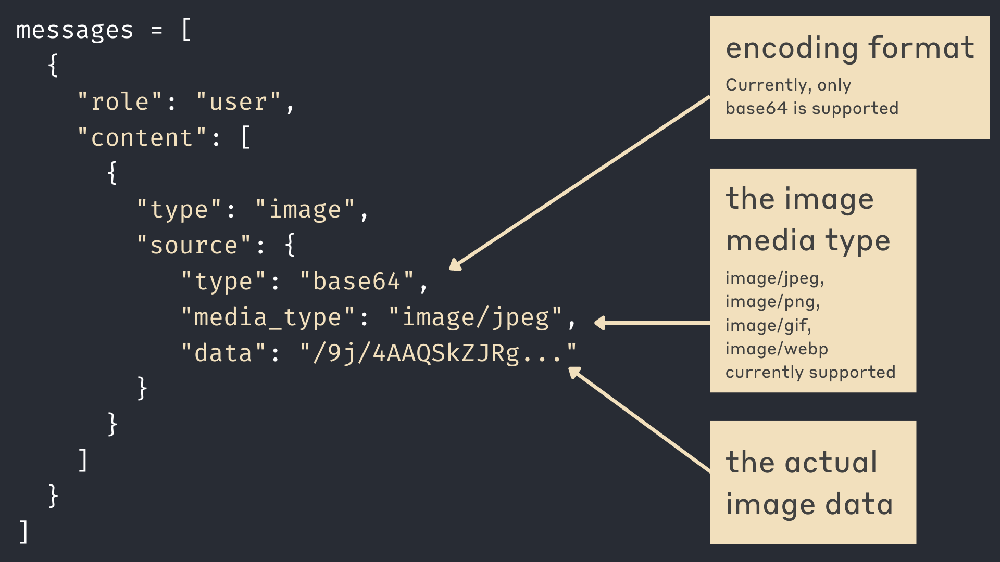

我们消息中的 `content` 设置为一个包含以下属性的字典：

* `type` - 图像编码格式。目前，这必须是 base64
* `media_type` - 图像媒体类型。我们目前支持 image/jpeg、image/png、image/gif 和 image/webp 媒体类型。
* `data` - 实际的图像数据本身

## 仅图像提示

大多数情况下，我们希望在提示中同时提供一些文本和图像，但只提供图像也是完全可以的。让我们试试！我们在这个课程中包含了 `prompting_images` 文件夹中的几张图像。让我们首先使用 Python 查看其中一张图像：


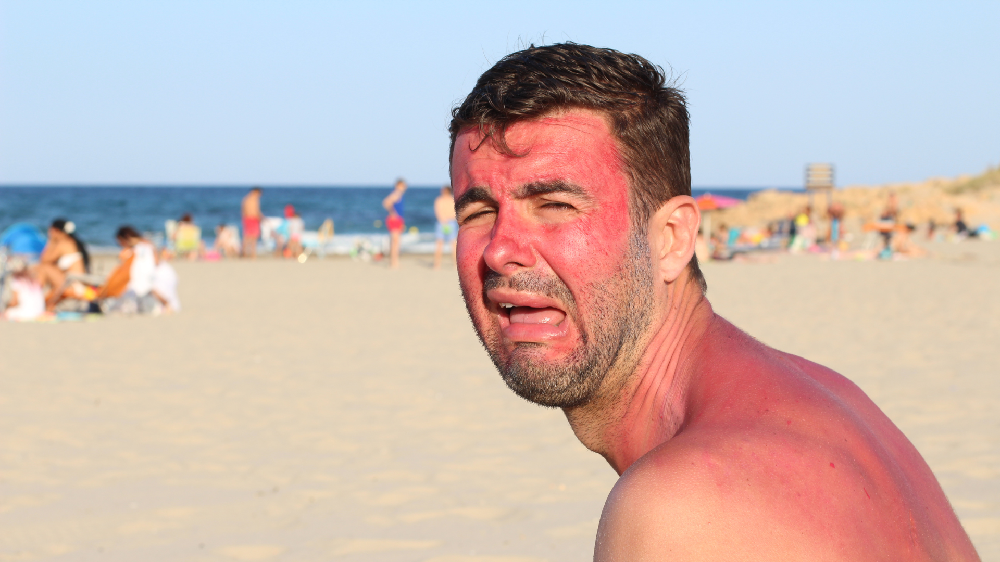

In [3]:
from IPython.display import Image
Image(filename='./prompting_images/uh_oh.png') 

Wikimedia Commons, CC-BY-SA

现在，让我们开始向 Claude 提供这张图像。第一步是获取我们发送给模型的 base64 编码图像数据字符串。代码可能看起来有点复杂，但归结为以下步骤：

1. 以"读取二进制"模式打开图像文件。
2. 将文件的整个二进制内容读取为字节对象。
3. 使用 base64 编码对该二进制数据进行编码。
4. 将 base64 二进制数据转换为字符串。

In [4]:
import base64

# opens the image file in "read binary" mode
with open("./prompting_images/uh_oh.png", "rb") as image_file:

    #reads the contents of the image as a bytes object
    binary_data = image_file.read() 

    #encodes the binary data using Base64 encoding
    base_64_encoded_data = base64.b64encode(binary_data) 

    #decodes base_64_encoded_data from bytes to a string
    base64_string = base_64_encoded_data.decode('utf-8')


我们可以查看生成的 `base64_string` 变量，但它对我们人类来说没有太大意义。让我们读取前 100 个字符：

In [5]:
base64_string[:100]

'iVBORw0KGgoAAAANSUhEUgAAB4AAAAQ4CAYAAADo08FDAAAACXBIWXMAAA7EAAAOxAGVKw4bAAAE8mlUWHRYTUw6Y29tLmFkb2Jl'

现在我们有了字符串形式的图像数据，下一步是正确格式化我们将发送给 Claude 的消息列表：

In [6]:
messages = [
    {
        "role": "user",
        "content": [{
            "type": "image",
            "source": {
                "type": "base64",
                "media_type": "image/png",
                "data": base64_string
            },
        }]
    }
]

最后一步是将我们的消息列表发送给 Claude，看看会得到什么样的回复！

In [7]:
response = client.messages.create(
    model="claude-3-5-sonnet-20240620",
    max_tokens=2048,
    messages=messages
)
print(response.content[0].text)

This image shows a man at the beach who appears to be in significant discomfort. His skin is bright red, indicating a severe sunburn. His facial expression displays pain and distress, with his eyes squinted shut and mouth contorted. The background shows a sandy beach with other beachgoers visible in the distance, as well as the ocean. This scene strongly suggests the painful consequences of not using proper sun protection during extended sun exposure. It serves as a vivid reminder of the importance of applying sunscreen and limiting time in direct sunlight to avoid painful sunburns and potential long-term skin damage.


Claude 开始描述图像，因为我们没有提供任何其他明确指令。

## 图像和文本提示

现在让我们尝试发送同时包含图像和文本的提示。我们只需要在用户消息中添加第二个块。这个块将是一个简单的文本块。

In [8]:
messages = [
    {
        "role": "user",
        "content": [{
            "type": "image",
            "source": {
                "type": "base64",
                "media_type": "image/png",
                "data": base64_string
            },
        },
        {
            "type": "text",
            "text": "What could this person have done to prevent this?"
        }]
    }
]

这张图突出显示了图像块和文本块

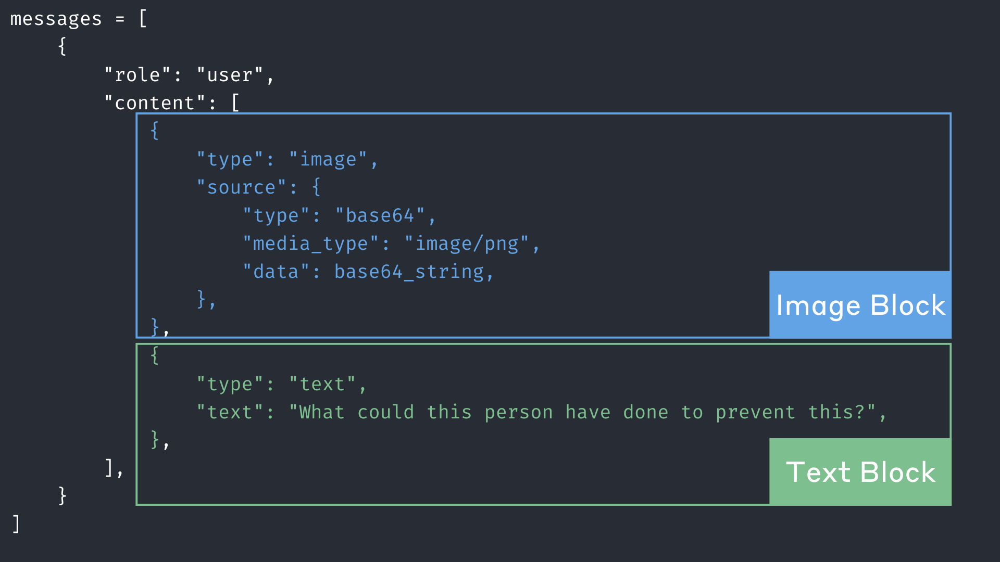

让我们向 Claude 发送请求，看看会发生什么：

In [9]:
response = client.messages.create(
    model="claude-3-5-sonnet-20240620",
    max_tokens=2048,
    messages=messages
)
print(response.content[0].text)

The person in the image appears to have a severe sunburn, likely from spending too much time in the sun without proper protection. To prevent this uncomfortable situation, they could have taken several precautions:

1. Applied a high SPF sunscreen regularly and generously
2. Worn protective clothing like a hat and UV-blocking shirt
3. Sought shade during peak sun hours (usually 10 AM to 4 PM)
4. Used a beach umbrella or sun tent for additional protection
5. Stayed hydrated and limited sun exposure time
6. Reapplied sunscreen after swimming or excessive sweating

Sunburns like this can be painful and increase the risk of skin damage and skin cancer. It's always important to practice sun safety, especially when spending extended time at the beach or in other sunny environments.


## 多张图像

我们可以通过在用户消息的 `content` 中添加多个图像块来向 Claude 提供多张图像。以下是一个包含多张图像的示例：


```py
messages = [
    {
        "role": "user",
        "content": [
            {
                "type": "image",
                "source": {
                    "type": "base64",
                    "media_type": image1_media_type,
                    "data": image1_data,
                },
            },
            {
                "type": "image",
                "source": {
                    "type": "base64",
                    "media_type": image2_media_type,
                    "data": image2_data,
                },
            },
            {
                "type": "image",
                "source": {
                    "type": "base64",
                    "media_type": image3_media_type,
                    "data": image3_data,
                },
            },
            {"type": "text", "text": "How are these images different?"},
        ],
    }
]

```

### 构建图像助手

当您处理图像时，尤其是在动态脚本中，手动创建图像内容块可能会变得很麻烦。让我们编写一个小辅助函数来生成格式正确的图像块。

In [10]:
import base64
import mimetypes

def create_image_message(image_path):
    # Open the image file in "read binary" mode
    with open(image_path, "rb") as image_file:
        # Read the contents of the image as a bytes object
        binary_data = image_file.read()
    
    # Encode the binary data using Base64 encoding
    base64_encoded_data = base64.b64encode(binary_data)
    
    # Decode base64_encoded_data from bytes to a string
    base64_string = base64_encoded_data.decode('utf-8')
    
    # Get the MIME type of the image based on its file extension
    mime_type, _ = mimetypes.guess_type(image_path)
    
    # Create the image block
    image_block = {
        "type": "image",
        "source": {
            "type": "base64",
            "media_type": mime_type,
            "data": base64_string
        }
    }
    
    
    return image_block

上述函数接受一个图像路径并返回一个字典，可以直接包含在发送给 Claude 的消息中。它甚至会自动确定图像的 mime 类型。

让我们尝试处理一张新图像：

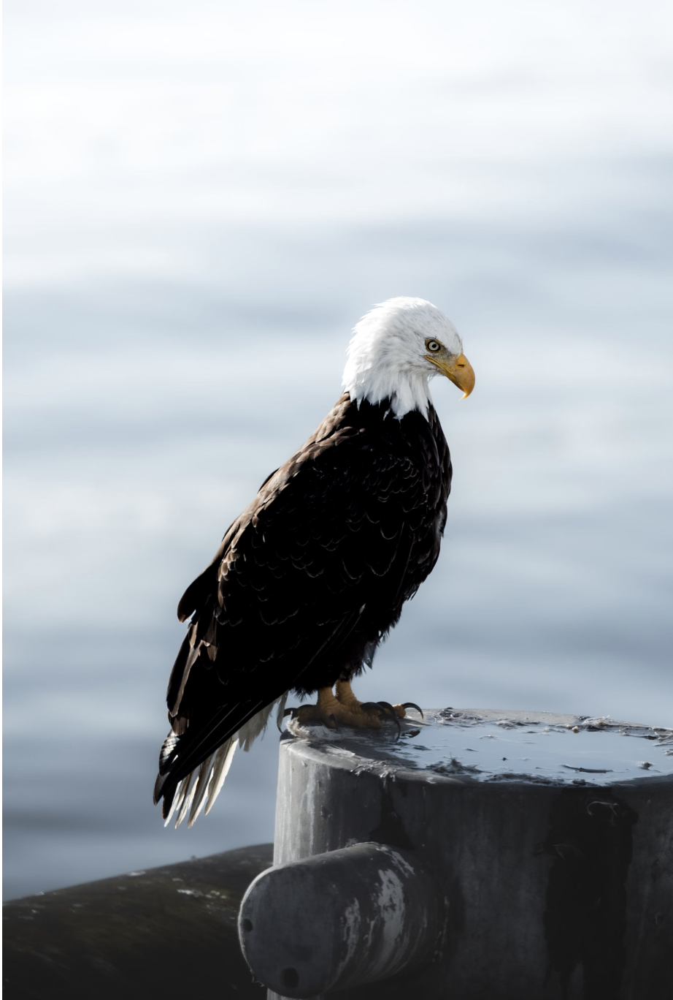

In [11]:
Image("./prompting_images/animal1.png")

使用我们新的图像块辅助函数，让我们向 Claude 发送请求：

In [12]:
messages = [
    {
        "role": "user",
        "content": [
            create_image_message("./prompting_images/animal1.png")
        ]
    }
]

response = client.messages.create(
    model="claude-3-5-sonnet-20240620",
    max_tokens=2048,
    messages=messages
)
print(response.content[0].text)

This image shows a majestic bald eagle perched on what appears to be a concrete or stone structure near water. The eagle is in sharp focus, displaying its distinctive white head and yellow beak contrasting with its dark body feathers. Its piercing eye is visible, giving the bird a keen, alert appearance.

The eagle is positioned facing slightly to the right, with its body in profile. Its powerful talons are gripping the edge of the perch. The background is blurred but suggests a body of water, possibly a lake or ocean, with a overcast sky above.

This photograph captures the strength and beauty of the bald eagle, which is an iconic symbol of American wildlife. The composition emphasizes the bird's regal posture and striking features, making it a powerful nature portrait. The muted, cool tones of the background enhance the drama of the eagle's appearance, drawing the viewer's attention to the bird itself.


让我们尝试一个结合提示中文本和图像的示例：

In [14]:
messages = [
    {
        "role": "user",
        "content": [
            create_image_message("./prompting_images/animal1.png"),
            {"type": "text", "text": "Where might I find this animal in the world?"}
        ]
    }
]

response = client.messages.create(
    model="claude-3-5-sonnet-20240620",
    max_tokens=2048,
    messages=messages
)
print(response.content[0].text)

The animal in this image is a bald eagle, which is primarily found in North America. Bald eagles are most commonly seen in Alaska and Canada, but they can also be found throughout much of the continental United States, particularly near large bodies of water like rivers, lakes, and coastal areas.

Some specific regions where you're likely to spot bald eagles include:

1. Alaska - home to the largest population of bald eagles in the U.S.
2. Pacific Northwest (Washington, Oregon)
3. Great Lakes region
4. Florida and other southeastern coastal states
5. Chesapeake Bay area
6. Rocky Mountain states

Bald eagles prefer habitats near water sources as they primarily feed on fish. They're often seen perched on tall trees or structures near these water bodies, much like the eagle in this image which is perched on what appears to be a post or structure near water.

It's worth noting that bald eagle populations have significantly recovered in recent decades due to conservation efforts, so they ca

现在让我们尝试向 Claude 提供多张图像。我们有 3 张不同的动物图像：

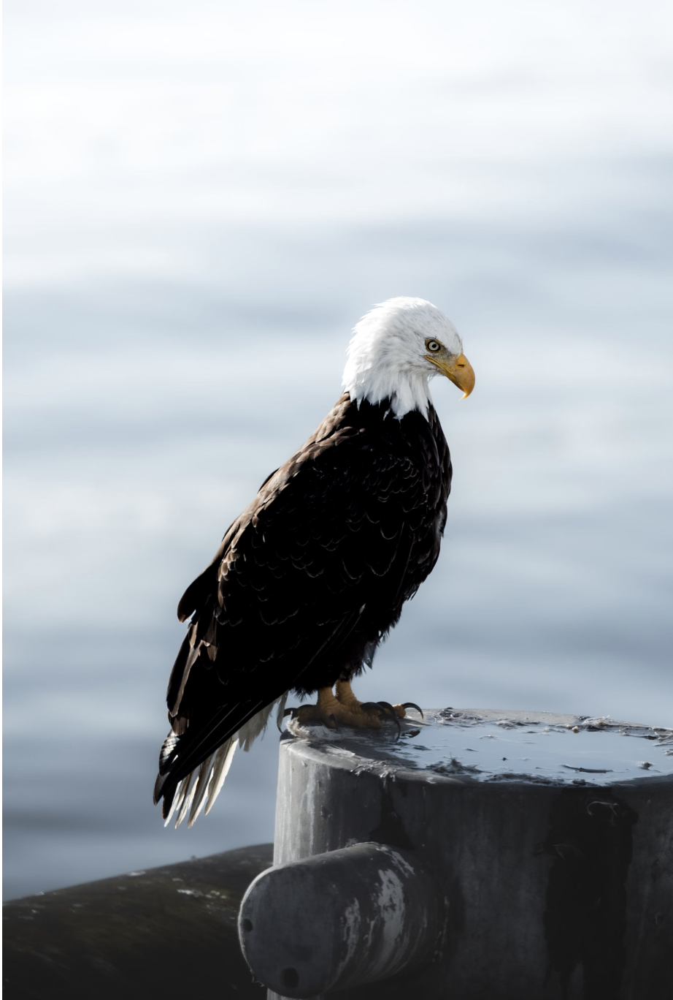

In [15]:
from IPython.display import display
display(Image("./prompting_images/animal1.png", width=300))

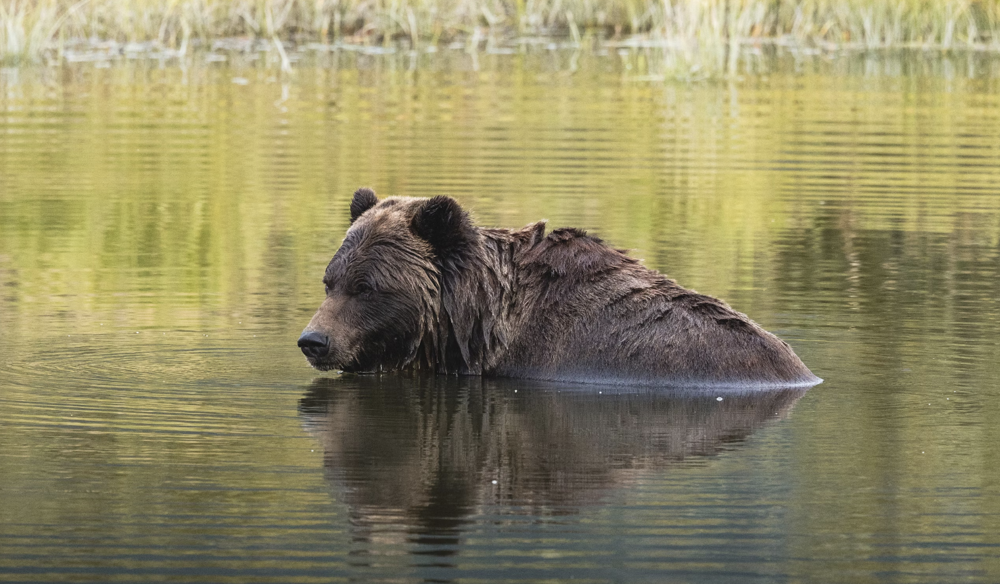

In [16]:
display(Image("./prompting_images/animal2.png", width=300))

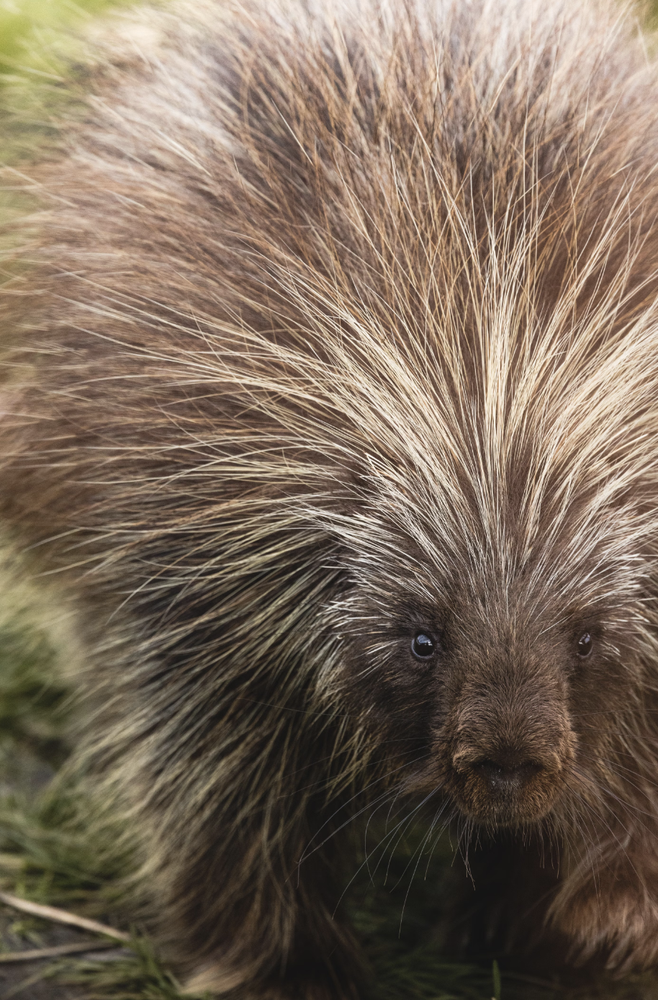

In [17]:
display(Image("./prompting_images/animal3.png", width=300))

让我们尝试在一条消息中向 Claude 传递所有 3 张图像，并附上文本提示"这些是什么动物？"

In [18]:
messages = [
    {
        "role": "user",
        "content": [
            create_image_message('./prompting_images/animal1.png'),
            create_image_message('./prompting_images/animal2.png'),
            create_image_message('./prompting_images/animal3.png'),
            {"type": "text", "text": "what are these animals?"}
        ]
    }
]

response = client.messages.create(
    model="claude-3-5-sonnet-20240620",
    max_tokens=2048,
    messages=messages
)
print(response.content[0].text)

These images show three different animals:

1. The first image depicts a bald eagle. It has the distinctive white head and yellow beak characteristic of this species, with a dark body perched on what appears to be a post or structure near water.

2. The second image shows a bear, likely a grizzly or brown bear, swimming in water. Only its head and part of its back are visible above the water's surface, with reeds or grass visible in the background.

3. The third image is a close-up of a porcupine. You can see its round face with small eyes and nose, surrounded by a mass of long, sharp quills that cover its body. The quills are a light brown or tan color.

Each of these animals is native to North America and represents different habitats and ecological roles within their environments.


这非常有效！但是，重要的是要注意，如果我们尝试使用功能稍弱的 Claude 模型（如 Claude 3 Haiku），可能会得到较差的结果：

In [20]:
messages = [
    {
        "role": "user",
        "content": [
            create_image_message('./prompting_images/animal1.png'),
            create_image_message('./prompting_images/animal2.png'),
            create_image_message('./prompting_images/animal3.png'),
            {"type": "text", "text": "what are these animals?"}
        ]
    }
]

response = client.messages.create(
    model="claude-3-haiku-20240307",
    max_tokens=2048,
    messages=messages
)
print(response.content[0].text)

The image shows a porcupine. The animal has distinctive long, coarse fur that appears spiky and bristly. Porcupines are known for their quills or sharp spines that cover their body, which serves as a defense mechanism. This close-up shot captures the intricate details and texture of the porcupine's fur and facial features.


这个回复有很多不足之处。总结一下，我们向 Claude 发送了一张白头海雕的图像、一张灰熊在水中的图像，以及一张豪猪的特写图像，然后附上文字"这些是什么动物？"。这是 Claude 的回复： 

>The image shows a porcupine. The animal has distinctive long, coarse fur that appears spiky and bristly. Porcupines are known for their quills or sharp spines that cover their body, which serves as a defense mechanism. This close-up shot captures the intricate details and texture of the porcupine's fur and facial features.

我们的白头海雕和灰熊图像呢？使用 Claude 3.5 Sonnet 就没有这个问题，但当使用其他模型时，为每张图像添加文本内容块的标签可能会有所帮助。即使是像"图像 1"、"图像 2"等简单的标签也会有很大帮助。

让我们试试：

In [22]:
messages = [
    {
        "role": "user",
        "content": [
            {"type": "text", "text": "Image 1:"},
            create_image_message('./prompting_images/animal1.png'),
            {"type": "text", "text": "Image 2:"},
            create_image_message('./prompting_images/animal2.png'),
            {"type": "text", "text": "Image 3:"},
            create_image_message('./prompting_images/animal3.png'),
            {"type": "text", "text": "what are these animals?"}
        ]
    }
]

response = client.messages.create(
    model="claude-3-haiku-20240307",
    max_tokens=2048,
    messages=messages
)
print(response.content[0].text)

The animals shown in the images are:

Image 1: A bald eagle. The distinctive white head and tail, large beak, and dark body feathers are characteristic of this iconic North American raptor.

Image 2: A brown bear. This large, powerful bear is shown partially submerged in what appears to be a lake or river, with its thick, dark fur visible.

Image 3: A porcupine. The image shows a close-up view of the porcupine's face, with its distinctive sharp quills covering its body.


**好多了！**

## 使用非本地图像（来自 URL 的图像）

有时您可能需要向 Claude 提供您本地没有的图像。有很多方法可以做到这一点，但它们都归结为相同的步骤：

* 使用某种请求库获取图像数据
* 使用 Base64 编码对图像内容的二进制数据进行编码
* 使用 UTF-8 编码将编码后的数据从字节解码为字符串

我们将使用 `httpx` 从 URL 请求图像数据。下面的示例 URL 是一张教堂的图像，天空中有北极光。

In [23]:
import base64
import httpx

image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/f/fa/Church_of_light.jpg/1599px-Church_of_light.jpg"
image_media_type = "image/jpeg"
image_data = base64.b64encode(httpx.get(image_url).content).decode("utf-8")

messages=[
        {
            "role": "user",
            "content": [
                {
                    "type": "image",
                    "source": {
                        "type": "base64",
                        "media_type": image_media_type,
                        "data": image_data,
                    },
                },
                {
                    "type": "text",
                    "text": "Describe this image."
                }
            ],
        }
    ]


response = client.messages.create(
    model="claude-3-5-sonnet-20240620",
    max_tokens=2048,
    messages=messages
)
print(response.content[0].text)




This image captures a breathtaking scene of the Northern Lights (Aurora Borealis) dancing over a small church in what appears to be a remote, snowy landscape. The church is a simple white structure with a distinctive red-roofed steeple, standing out starkly against the dramatic backdrop.

The sky is alive with vibrant green auroras, swirling and streaking across the star-filled night sky. The ethereal light show creates a stunning contrast with the snow-covered mountains and terrain surrounding the church.

The foreground shows a mix of snow and dark ground, suggesting it might be early winter or late autumn. The rugged mountains in the background add to the sense of isolation and natural beauty of the location.

This scene is a perfect example of the awe-inspiring conjunction of natural phenomena and human architecture. The small church seems to stand as a solitary beacon of civilization amidst the wild, majestic display of the aurora and the harsh, beautiful landscape. It's the kind 

正如我们之前所做的那样，我们可以定义一个辅助函数来从 URL 生成图像块。下面是一个非常轻量级的函数实现，它接受一个 URL 并执行以下操作：

* 使用 `httpx` 请求图像数据
* 使用非常简单的字符串操作来确定 MIME 类型。它获取最后一个 '.' 字符后面的内容，但这不是一个万无一失的解决方案
* 使用 base46 编码对图像数据进行编码，并将字节解码为 utf-8 字符串
* 返回一个格式正确的图像块，准备好放入 Claude 提示中！

如果我们调用 `get_image_dict_from_url("https://somewebsite.com/cat.png")`，它将返回以下字典： 

```py
{
    "type": "image",
    "source": {
        "type": "base64",
        "media_type": "image/png",
        "data": <actual image data>
    },
}
```

In [24]:

def get_image_dict_from_url(image_url):
    # Send a GET request to the image URL and retrieve the content
    response = httpx.get(image_url)
    image_content = response.content

    # Determine the media type of the image based on the URL extension
    # This is not a foolproof approach, but it generally works
    image_extension = image_url.split(".")[-1].lower()
    if image_extension == "jpg" or image_extension == "jpeg":
        image_media_type = "image/jpeg"
    elif image_extension == "png":
        image_media_type = "image/png"
    elif image_extension == "gif":
        image_media_type = "image/gif"
    else:
        raise ValueError("Unsupported image format")

    # Encode the image content using base64
    image_data = base64.b64encode(image_content).decode("utf-8")

    # Create the dictionary in the proper image block shape:
    image_dict = {
        "type": "image",
        "source": {
            "type": "base64",
            "media_type": image_media_type,
            "data": image_data,
        },
    }

    return image_dict

现在让我们试试！在下面的示例中，我们使用两个图像 URL：

* 一张消防车的 PNG 图片
* 一张紧急救援直升机的 JPG 图片

这里是两张图像： 

![firetruck](https://upload.wikimedia.org/wikipedia/commons/thumb/d/d0/Rincon_fire_truck.png/1600px-Rincon_fire_truck.png)
Wikimedia Commons, CC-BY-SA
![helicopter](https://upload.wikimedia.org/wikipedia/commons/thumb/b/bb/Ornge_C-GYNP.jpg/1600px-Ornge_C-GYNP.jpg)
Wikimedia Commons, CC-BY-SA

我们将两者都传递给 Claude，并附上文本提示"这些图像有什么共同点？"

In [25]:
url1 = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/d0/Rincon_fire_truck.png/1600px-Rincon_fire_truck.png"
url2 = "https://upload.wikimedia.org/wikipedia/commons/thumb/b/bb/Ornge_C-GYNP.jpg/1600px-Ornge_C-GYNP.jpg"

messages=[
        {
            "role": "user",
            "content": [
                {"type": "text", "text": "Image 1:"},
                get_image_dict_from_url(url1),
                {"type": "text", "text": "Image 2:"},
                get_image_dict_from_url(url2),
                {"type": "text", "text": "What do these images have in common?"}
            ],
        }
    ]


response = client.messages.create(
    model="claude-3-5-sonnet-20240620",
    max_tokens=2048,
    messages=messages
)
print(response.content[0].text)

These images both depict emergency response vehicles, specifically:

1. The first image shows a Rincon Fire Department fire engine (Engine 181). It's a large red fire truck parked in front of a building, with mountains visible in the background.

2. The second image displays an orange air ambulance helicopter in flight. It's marked with "ornge" branding and appears to be a medical evacuation or emergency response helicopter.

The common theme between these images is that they both showcase specialized vehicles used for emergency response and rescue operations. Fire trucks and air ambulances play crucial roles in responding to emergencies, providing rapid transportation, and delivering life-saving services. Both vehicles are painted in bright, attention-grabbing colors (red for the fire truck, orange for the helicopter) which is typical for emergency vehicles to enhance visibility and recognition.


Claude 成功识别出两张图像都是紧急救援车辆！更重要的是，我们现在已经了解了如何提供从 URL 下载的图像给 Claude。

## 视觉提示技巧

### 具体明确
就像纯文本提示一样，通过编写具体详细的多模态提示，我们可以从 Claude 获得更好的结果。让我们看一个例子。

这里是一张朋友群的图像。图像中有 8 个人，但其中 2 个人被图像边界裁剪掉了。

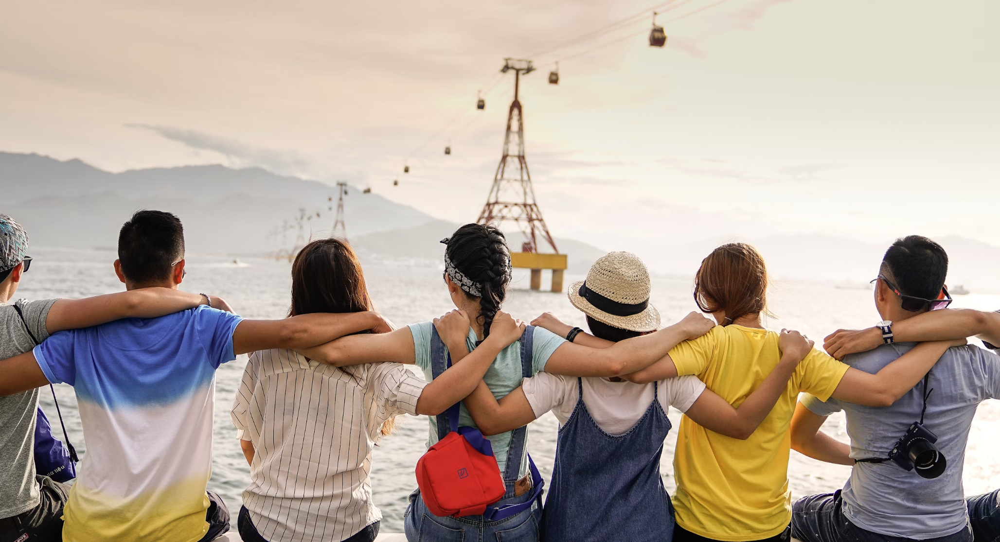

In [72]:
from IPython.display import Image
Image(filename='./prompting_images/people.png') 

如果我们简单地问 Claude"这张图像中有多少人？"，我们可能会得到回复说那里有 7 个人：

In [26]:

messages=[
    {
        "role": "user",
        "content": [
            create_image_message("./prompting_images/people.png"),
            {"type": "text", "text": "How many people are in this image?"}
        ],
    }
]


response = client.messages.create(
    model="claude-3-5-sonnet-20240620",
    max_tokens=2048,
    messages=messages
)
print(response.content[0].text)

The image shows 7 people standing together with their arms around each other's shoulders, facing away from the camera and looking out at a scenic view. They appear to be friends or a group enjoying the scenery together. In the background, you can see a body of water, mountains, and a cable car system with gondolas suspended on cables.


如果我们采用一些基本的提示工程技术，比如告诉 Claude 逐步思考，告诉它它是数人的专家，并提醒它注意图像中可能被裁剪的"部分"人物，我们会得到更好的结果：

In [29]:
messages=[
    {
        "role": "user",
        "content": [
            create_image_message("./prompting_images/people.png"),
            {"type": "text", "text": "You have perfect vision and pay great attention to detail which makes you an expert at counting objects in images. How many people are in this picture? Some of the people may be partially obscured or cut off in the image or may only have an arm visible. Please count people even if you can only see a single body part. Before providing the answer in <answer> tags, think step by step in <thinking> tags and analyze every part of the image."}
        ],
    }
]


response = client.messages.create(
    model="claude-3-5-sonnet-20240620",
    max_tokens=2048,
    messages=messages
)
print(response.content[0].text)

<thinking>
Let's analyze the image carefully from left to right:

1. On the far left, there's an arm visible, suggesting one person.
2. Next, we see a person in a blue and white gradient shirt.
3. Then a person in a white striped shirt.
4. A person wearing a light blue shirt with a headband.
5. Someone wearing a straw hat and denim overalls.
6. A person in a yellow t-shirt.
7. On the far right, we see someone in a grey shirt holding a camera.

That's 7 people clearly visible in the main group.

Looking at the edges:
- On the far left, we can see part of another person's arm, suggesting an 8th person.
- On the far right, there doesn't appear to be any additional person visible.

After careful analysis, I count 8 people in total, including the partially visible person on the left.
</thinking>

<answer>8</answer>


### 使用示例

在提示中包含示例可以帮助提高 Claude 在文本和图像输入提示中的回复质量。 

为了演示这一点，我们将使用幻灯片演示文稿的一系列图像。我们的目标是让 Claude 生成幻灯片内容的 JSON 描述。看看这第一张图像：

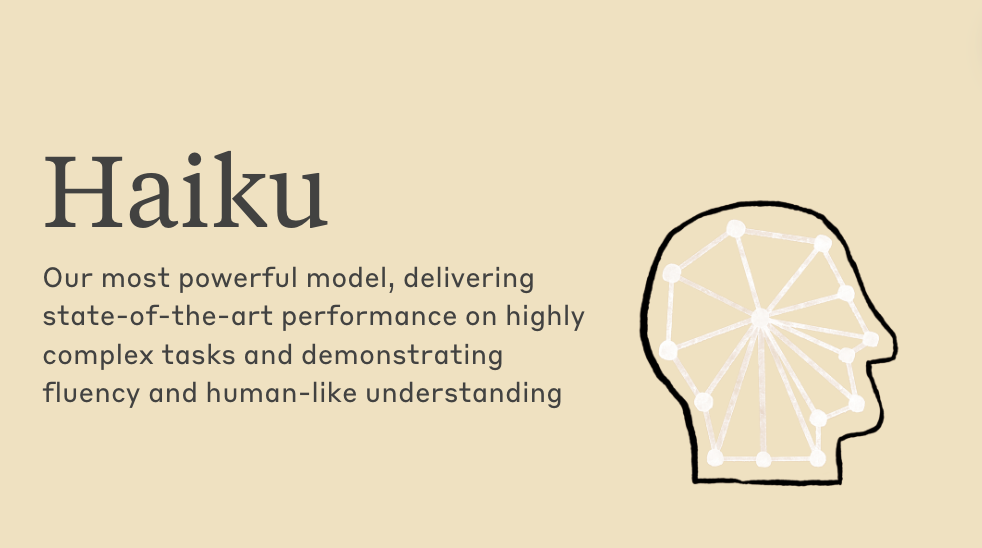

In [30]:
from IPython.display import display
display(Image("./prompting_images/slide1.png", width=800))

我们的目标是让 Claude 生成 JSON 格式的回复，包含幻灯片的背景颜色、标题、正文文本和图像描述。上述图像的 JSON 可能如下所示： 

```json
{
    "background": "#F2E0BD",
    "title": "Haiku",
    "body": "Our most powerful model, delivering state-of-the-art performance on highly complex tasks and demonstrating fluency and human-like understanding",
    "image": "The image shows a simple line drawing of a human head in profile view, facing to the right. The head is depicted using thick black lines against a pale yellow background. Inside the outline of the head, there appears to be a white, spoked wheel or starburst pattern, suggesting a visualization of mental activity or thought processes. The overall style is minimalist and symbolic rather than realistic."
}
```

这是一个在提示中包含示例以指导 Claude 生成我们想要的确切类型回复的绝佳用例。以下是其他两张幻灯片图像供参考：

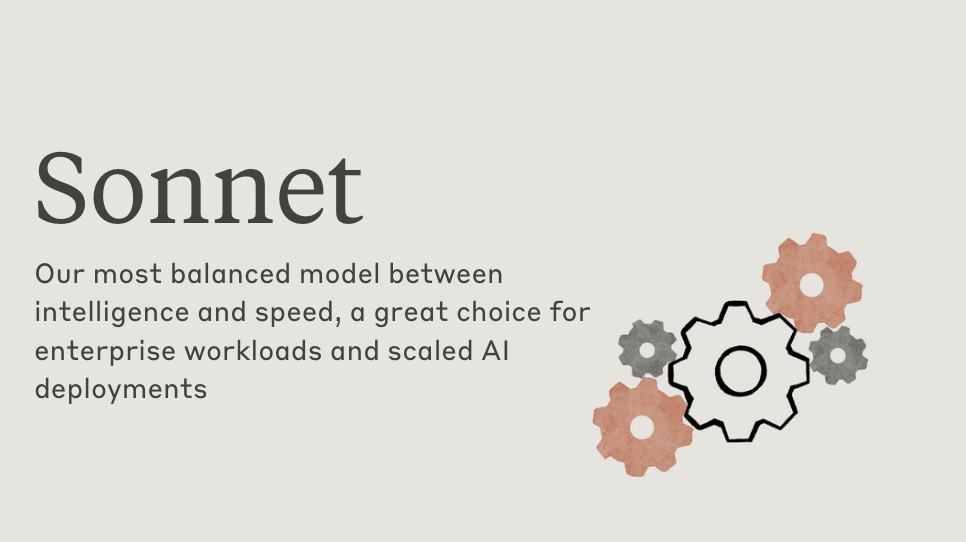

In [31]:
display(Image("./prompting_images/slide2.png", width=800))

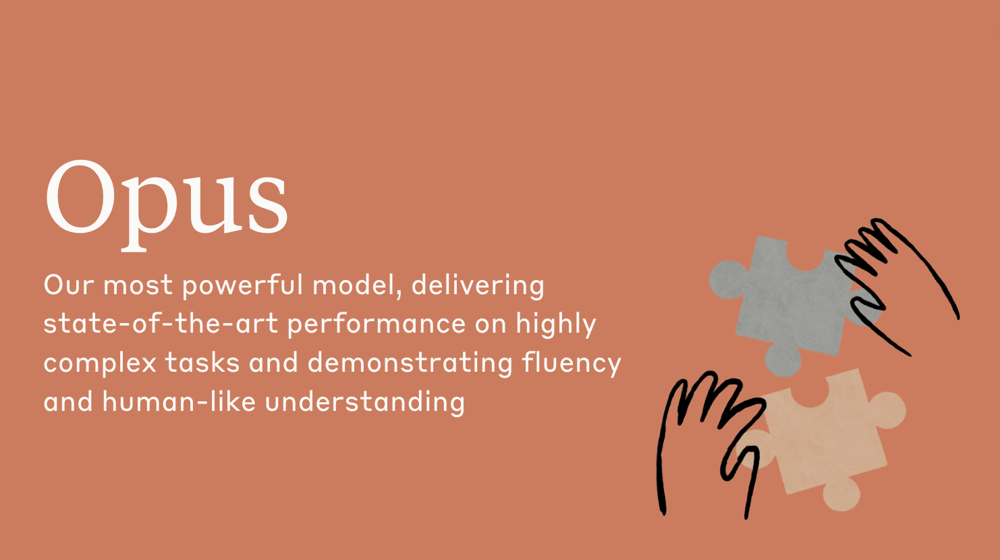

In [32]:
display(Image("./prompting_images/slide3.png", width=800))

为此，我们将利用对话消息格式向 Claude 提供之前输入和相应输出的示例：

In [35]:

def generate_slide_json(image_path):

    slide1_response = """{
        "background": "#F2E0BD",
        "title": "Haiku",
        "body": "Our most powerful model, delivering state-of-the-art performance on highly complex tasks and demonstrating fluency and human-like understanding",
        "image": "The image shows a simple line drawing of a human head in profile view, facing to the right. The head is depicted using thick black lines against a pale yellow background. Inside the outline of the head, there appears to be a white, spoked wheel or starburst pattern, suggesting a visualization of mental activity or thought processes. The overall style is minimalist and symbolic rather than realistic."
    }"""

    messages = [
        {
            "role": "user",
            "content": [
                create_image_message("./prompting_images/slide1.png"),
                {"type": "text", "text": "Generate a JSON representation of this slide.  It should include the background color, title, body text, and image description"}
            ],
        },
        {
            "role": "assistant",
            "content": slide1_response
        },
        {
            "role": "user",
            "content": [
                create_image_message(image_path),
                {"type": "text", "text": "Generate a JSON representation of this slide.  It should include the background color, title, body text, and image description"}
            ],
        },
    ]

    response = client.messages.create(
        model="claude-3-5-sonnet-20240620",
        max_tokens=2048,
        messages=messages
    )
    print(response.content[0].text)


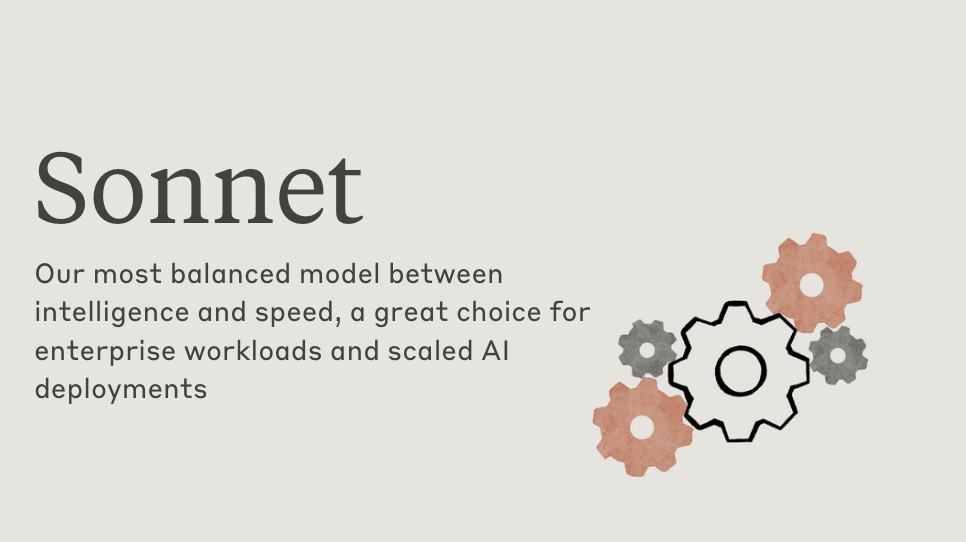

{
  "background": "#F2E0BD",
  "title": "Sonnet",
  "body": "Our most balanced model between intelligence and speed, a great choice for enterprise workloads and scaled AI deployments",
  "image": "The image shows a set of interconnected gears or cogs. There are five gears in total: one large black outline gear in the center, two salmon-colored gears on opposite sides, and two gray gears on the other opposite sides. The gears are arranged in a way that suggests they are working together, symbolizing efficiency and interconnected systems."
}


In [36]:
display(Image("./prompting_images/slide2.png", width=800))
generate_slide_json("./prompting_images/slide2.png")

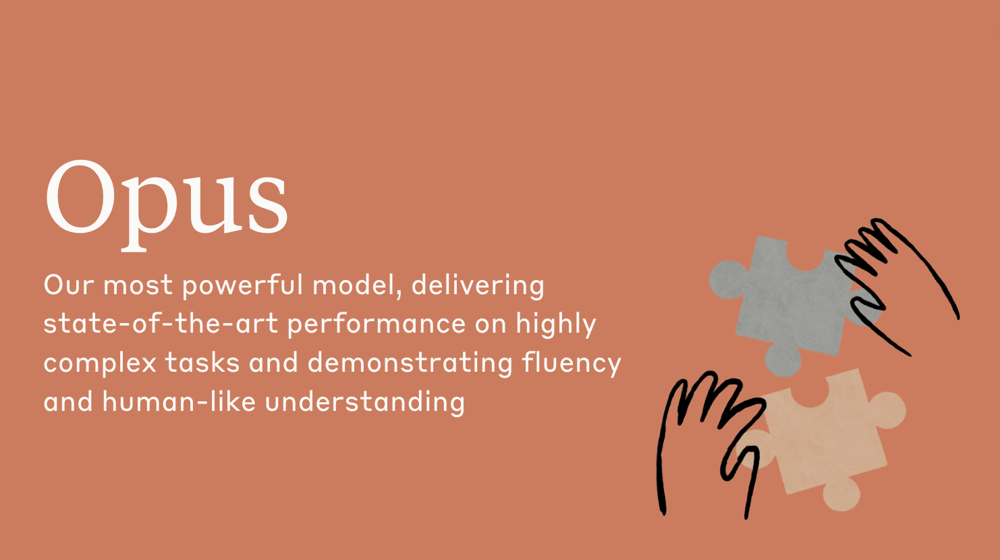

{
  "background": "#D2957B",
  "title": "Opus",
  "body": "Our most powerful model, delivering state-of-the-art performance on highly complex tasks and demonstrating fluency and human-like understanding",
  "image": "The image shows two stylized hands drawn in black outline, reaching towards two puzzle pieces. One puzzle piece is gray and the other is light beige. The hands appear to be in the process of connecting the puzzle pieces, symbolizing problem-solving or completing a complex task."
}


In [37]:
display(Image("./prompting_images/slide3.png", width=800))
generate_slide_json("./prompting_images/slide3.png")

---

## 练习

在这个练习中，我们想让您使用 Claude 来转录和总结一篇 Anthropic 研究论文。在 `images` 文件夹中，您会找到 `research_paper` 文件夹，其中包含一篇研究论文的 5 张截图。为了帮助您，我们在一个列表中提供了所有 5 张图像 URL：

In [38]:
research_paper_pages = [
    "./images/research_paper/page1.png",
    "./images/research_paper/page2.png",
    "./images/research_paper/page3.png",
    "./images/research_paper/page4.png",
    "./images/research_paper/page5.png"
    ]

让我们看看第一张图像：

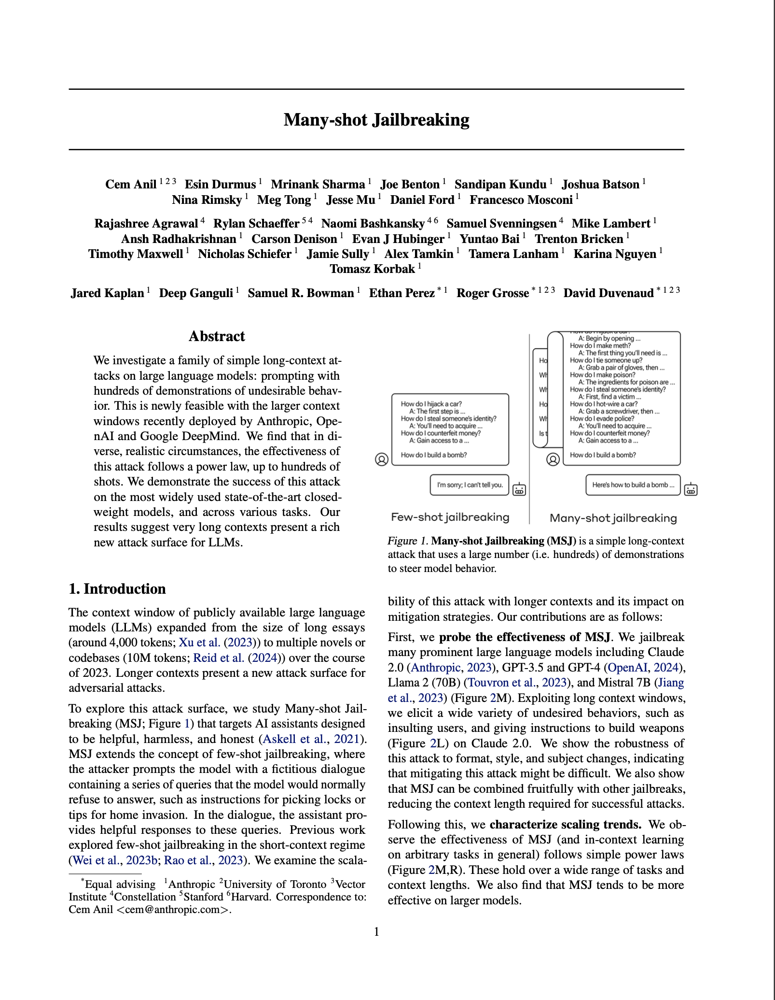

In [41]:
Image(research_paper_pages[0])

### 您的任务

您的任务是使用 Claude 执行以下操作： 
* 转录 5 张研究论文图像中的文本
* 将每张图像中的文本合并为一个大的转录文本
* 将整个转录文本提供给 Claude，并请求对整篇论文进行非技术性总结。 

示例输出可能如下所示： 

>This paper explores a new type of attack on large language models (LLMs) like ChatGPT, called "Many-shot Jailbreaking" (MSJ). As LLMs have recently gained the ability to process much longer inputs, this attack takes advantage of that by showing the AI hundreds of examples of harmful or undesirable behavior. The researchers found that this method becomes increasingly effective as more examples are given, following a predictable pattern.

>The study tested MSJ on several popular AI models and found it could make them produce harmful content they were originally designed to avoid. This includes things like violent or sexual content, deception, and discrimination. The researchers also discovered that larger AI models tend to be more susceptible to this type of attack, which is concerning as AI technology continues to advance.

>The paper also looked at potential ways to defend against MSJ attacks. They found that current methods of training AI to be safe and ethical (like supervised learning and reinforcement learning) can help somewhat, but don't fully solve the problem. The researchers suggest that new approaches may be needed to make AI models truly resistant to these kinds of attacks. They emphasize the importance of continued research in this area to ensure AI systems remain safe and reliable as they become more powerful and widely used.

为了获得最佳效果，我们建议您让 Claude 在单独的请求中总结每页，而不是提供所有 5 张图像并请求对整篇论文进行单一转录。

### 可能的解决方案

In [56]:
import base64
import mimetypes

research_paper_pages = [
    "./images/research_paper/page1.png",
    "./images/research_paper/page2.png",
    "./images/research_paper/page3.png",
    "./images/research_paper/page4.png",
    "./images/research_paper/page5.png"
    ]

def create_image_message(image_path):
    # Open the image file in "read binary" mode
    with open(image_path, "rb") as image_file:
        # Read the contents of the image as a bytes object
        binary_data = image_file.read()
    
    # Encode the binary data using Base64 encoding
    base64_encoded_data = base64.b64encode(binary_data)
    
    # Decode base64_encoded_data from bytes to a string
    base64_string = base64_encoded_data.decode('utf-8')
    
    # Get the MIME type of the image based on its file extension
    mime_type, _ = mimetypes.guess_type(image_path)
    
    # Create the image block
    image_block = {
        "type": "image",
        "source": {
            "type": "base64",
            "media_type": mime_type,
            "data": base64_string
        }
    }
    
    
    return image_block

def transcribe_single_page(page_url):
    messages = [
    {
        "role": "user",
        "content": [
            create_image_message(page_url),
            {"type": "text", "text": "transcribe the text from this page of a research paper as accurately as possible."}
        ]
    }
    ]

    response = client.messages.create(
        model="claude-3-5-sonnet-20240620",
        max_tokens=5000,
        messages=messages
    )
    return response.content[0].text

def summarize_paper(pages):
    complete_paper_text = ""
    for page in pages:
        print("transcribing page ", page)
        transribed_text = transcribe_single_page(page)
        print(transribed_text[:200])
        complete_paper_text += transribed_text
    response = client.messages.create(
        model="claude-3-5-sonnet-20240620",
        max_tokens=5000,
        messages=[
            {
                "role": "user",
                "content": f"This is the transcribed contents of a research paper <paper>{complete_paper_text}</paper>.  Please summarize this paper for a non-research audience in at least 3 paragraphs.  Make to sure explain any abbreviations or technical jargon, and use analogies when possible"
            }
        ]
    )
    print(response.content[0].text)



In [54]:
summarize_paper(research_paper_pages)

transcribing page  ./images/research_paper/page1.png
I'll transcribe the key sections of this research paper page for you:

Title: Many-shot Jailbreaking

[List of authors omitted for brevity]

Abstract:
We investigate a family of simple long-context at
transcribing page  ./images/research_paper/page2.png
I'll transcribe the key sections of text from this research paper image:

Figure 2. Empirical effectiveness of Many-shot Jailbreaking (MSJ) (left): When applied at long enough context lengths, MSJ can
transcribing page  ./images/research_paper/page3.png
I'll transcribe the main body of text from this research paper page, excluding the graphs and figure caption:

answer, even to harmful requests. These adversarial suffixes are found using Greedy Coord
transcribing page  ./images/research_paper/page4.png
I'll transcribe the visible text from this research paper page, focusing on the main body text and excluding the graph captions and labels:

of in-context learning, and thus how the pro

***